MTH4320 Poject 1: 3D_slAIcer

Mawaba Pascal Dao

Dr. White

Florida Institute of Technology

10/14/2021

note: View dataGeneration.ipynb for a write up about the project and the data generation code

In [1]:
from google.colab import drive
import os
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import random

In [3]:
drive.mount('/content/drive', force_remount=True)
print(os.getcwd())

Mounted at /content/drive
/content


## Loading data and preprocessing

In [ ]:
# train_data_dir = "/content/drive/MyDrive/MTH4320/data/coseg/coseg_aliens/train/features"
# labels_dir = "/content/drive/MyDrive/MTH4320/data/coseg/coseg_aliens/train/labels"

train_data_dir = "/content/drive/MyDrive/MTH4320/data/train/data"
train_labels_dir = "/content/drive/MyDrive/MTH4320/data/train/labels"

test_data_dir = "/content/drive/MyDrive/MTH4320/data/test/data"

test_labels_dir = "/content/drive/MyDrive/MTH4320/data/test/labels"


def loadData(features_dir, labels_dir, desc):
  raw_features = []
  raw_labels = []

  # for filename in os.listdir(features_dir):
 
  files = os.listdir(features_dir)
  random.shuffle(files) #Randomly shuffle order in which we load files
  print(files)
  for i in tqdm(range(len(files)), desc=f'Loading {desc}...'):
    filename = files[i]
    # print(filename)
    trainFile = os.path.join(features_dir, filename)
    labelFile = os.path.join(labels_dir, filename)

    if filename in os.listdir(labels_dir): #Make sure this sample has a label
      meshFeatures = np.load(trainFile)
      # print(meshFeatures.shape)

      # raw_features.append(meshFeatures)
      # label = np.load(labelFile)
      # raw_labels.append(label[:,:2])

      # print(f'nEdges in features: {meshFeatures.shape[0]}')

      if meshFeatures.shape[0] == 4500 or meshFeatures.shape[0] == 1000 or meshFeatures.shape[0] == 3000:
        raw_features.append(meshFeatures)
        label = np.load(labelFile)
        raw_labels.append(label[:,:2])
        # plotSlice(raw_labels[-1])

  return raw_features, raw_labels

raw_features, raw_labels = loadData(train_data_dir , train_labels_dir, 'training data')
raw_test_features, raw_test_labels = loadData(test_data_dir, test_labels_dir, 'test data')

X_train, y_train = dataProcessing(raw_features, raw_labels)
X_test, y_test = dataProcessing(raw_test_features, raw_test_labels)

X_train = X_train[:250]
y_train = y_train[:250]

X_test = X_test[:250]
y_test = y_test[:250]

print(f'X train shape: {X_train.shape}')
print(f'y train shape: {y_train.shape}')

print(f'X test shape: {X_test.shape}')
print(f'y test shape: {y_test.shape}')

['0163_coseg_vases.npy', '0109_coseg_chairs.npy', '161_coseg_aliens.npy', '0349_coseg_chairs.npy', '0040_coseg_chairs.npy', '0018_coseg_chairs.npy', '71_coseg_aliens.npy', '0210_coseg_chairs.npy', '0258_coseg_chairs.npy', '0246_coseg_chairs.npy', '0155_coseg_vases.npy', '0139_coseg_vases.npy', '0097_coseg_chairs.npy', '121_coseg_aliens.npy', '0372_coseg_chairs.npy', '134_coseg_aliens.npy', '0252_coseg_chairs.npy', '0073_coseg_vases.npy', '96_coseg_aliens.npy', '15_coseg_aliens.npy', '0061_coseg_vases.npy', '0076_coseg_vases.npy', '0110_coseg_chairs.npy', '0201_coseg_vases.npy', '0204_coseg_vases.npy', '180_coseg_aliens.npy', '0251_coseg_chairs.npy', '0359_coseg_chairs.npy', '0068_coseg_vases.npy', '0261_coseg_chairs.npy', '85_coseg_aliens.npy', '156_coseg_aliens.npy', '0108_coseg_vases.npy', '0247_coseg_vases.npy', '0118_coseg_chairs.npy', '0012_coseg_vases.npy', '0181_coseg_chairs.npy', '0095_coseg_chairs.npy', '0039_coseg_vases.npy', '0147_coseg_vases.npy', '0363_coseg_chairs.npy', '

Loading training data...: 100%|██████████| 758/758 [04:09<00:00,  3.03it/s]


['0300_coseg_vases.npy', '0295_coseg_chairs.npy', '0295_coseg_vases.npy', '0321_coseg_chairs.npy', '0014_coseg_chairs.npy', '0361_coseg_chairs.npy', '0049_coseg_chairs.npy', '0258_coseg_vases.npy', '0242_coseg_vases.npy', '0170_coseg_vases.npy', '0059_coseg_chairs.npy', '0272_coseg_chairs.npy', '53_coseg_aliens.npy', '179_coseg_aliens.npy', '0059_coseg_vases.npy', '0188_coseg_vases.npy', '0341_coseg_chairs.npy', '0162_coseg_chairs.npy', '99_coseg_aliens.npy', '0190_coseg_chairs.npy', '93_coseg_aliens.npy', '0122_coseg_vases.npy', '0151_coseg_chairs.npy', '0190_coseg_vases.npy', '35_coseg_aliens.npy', '0055_coseg_chairs.npy', '142_coseg_aliens.npy', '0100_coseg_vases.npy', '0176_coseg_chairs.npy', '117_coseg_aliens.npy', '0277_coseg_vases.npy', '0346_coseg_chairs.npy', '0237_coseg_chairs.npy', '0103_coseg_vases.npy', '0161_coseg_vases.npy', '0345_coseg_chairs.npy', '0021_coseg_chairs.npy', '0053_coseg_vases.npy', '132_coseg_aliens.npy', '0350_coseg_chairs.npy', '0384_coseg_chairs.npy', 

Loading test data...: 100%|██████████| 134/134 [00:42<00:00,  3.13it/s]


X train shape: (250, 2250)
y train shape: (250, 400)
X test shape: (130, 2250)
y test shape: (130, 400)


## Feed forward NN

In [ ]:
model = FeedforwardNeuralNetwork([X_train.shape[1], 320, 160, y_train.shape[1]], alpha=0.0001,  activation='ELU', initialization=['Glorot', 'uniform'], lambda1=0.1, lambda2=0.001, gamma=0.1)

model.fit(X_train, y_train, 5000, 10)

Training started
Epoch = 10 loss =  7721.106813422986
Layer 0 weight norm: 23.637931719967554
Listing files in path...
Saved model: 307.npy
New weights are not better
---------------------------------
Epoch = 20 loss =  7223.52911286265
Layer 0 weight norm: 23.57689557037905
Listing files in path...
Saved model: 307.npy
New weights are not better
---------------------------------
Epoch = 30 loss =  7167.450423741221
Layer 0 weight norm: 23.564447093209573
Listing files in path...
Saved model: 307.npy
New weights are not better
---------------------------------
Epoch = 40 loss =  6631.1350823761295
Layer 0 weight norm: 23.577829844493024
Listing files in path...
Saved model: 307.npy
New weights are not better
---------------------------------
Epoch = 50 loss =  6333.753214014995
Layer 0 weight norm: 23.568724605930928
Listing files in path...
Saved model: 307.npy
New weights are not better
---------------------------------
Epoch = 60 loss =  5511.403679397488
Layer 0 weight norm: 23.533

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


Epoch = 1150 loss =  295.2193234707349
Layer 0 weight norm: 16.233633745597807
Listing files in path...
Saved model: 297.npy
Better model saved!
---------------------------------
Epoch = 1160 loss =  298.21968318778414
Layer 0 weight norm: 16.169451094252484
Listing files in path...
Saved model: 295.npy
New weights are not better
---------------------------------
Epoch = 1170 loss =  290.40406444806814
Layer 0 weight norm: 16.105444600902736
Listing files in path...
Saved model: 295.npy
Better model saved!
---------------------------------
Epoch = 1180 loss =  279.46496132215026
Layer 0 weight norm: 16.041586210959263
Listing files in path...
Saved model: 290.npy
Better model saved!
---------------------------------
Epoch = 1190 loss =  281.5238032173702
Layer 0 weight norm: 15.977959566640523
Listing files in path...
Saved model: 279.npy
New weights are not better
---------------------------------
Epoch = 1200 loss =  275.8421533872947
Layer 0 weight norm: 15.914403231000831
Listing f

## Ploting training performance

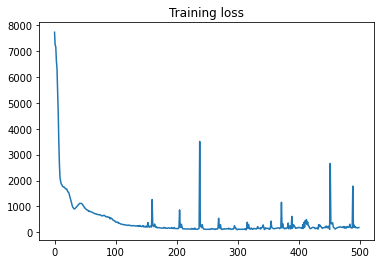

Text(0.5, 1.0, 'Training loss')

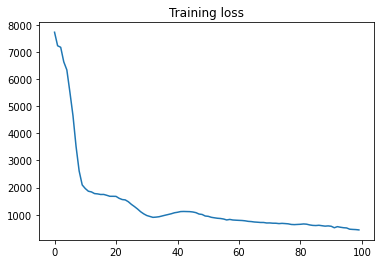

In [ ]:
plt.plot(model.losses)
plt.title("Training loss")
plt.show()
plt.plot(model.losses[:100])
plt.title("Training loss")


## Predictions on training set

(250, 2250)


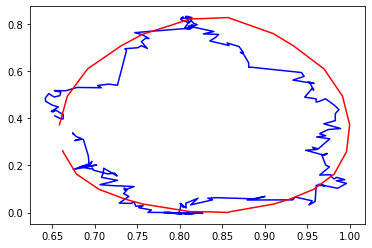

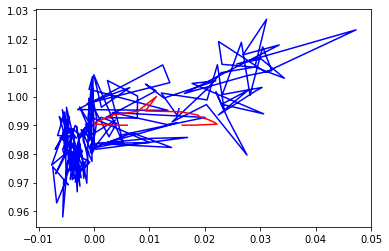

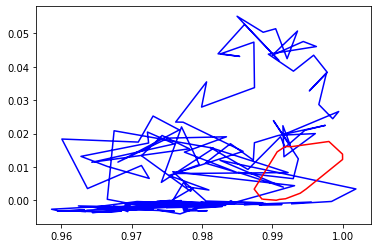

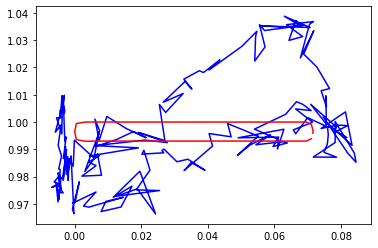

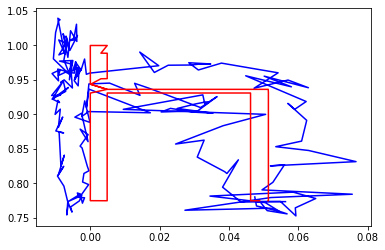

...

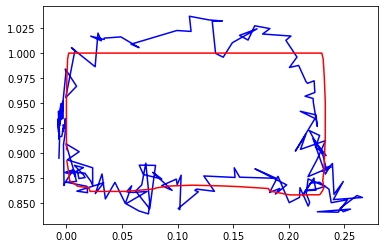

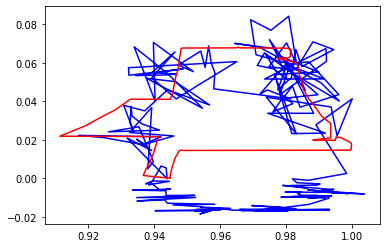

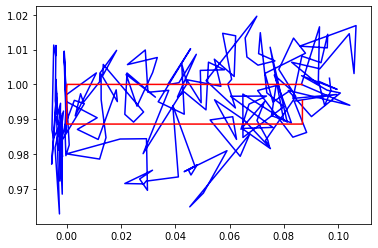

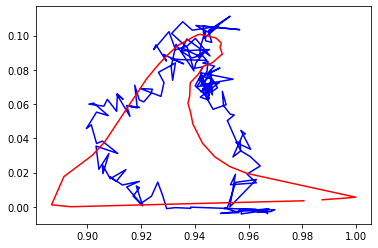

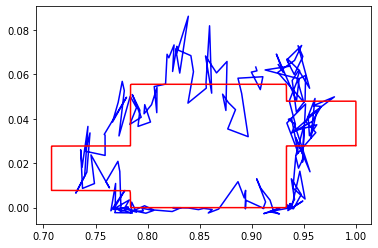

In [ ]:
#Plotting predictions on train
def plotComparison(y_pred, y_true):
  y_pred = y_pred.reshape((200,2))
  y_true = y_true.reshape((200,2))
  ax = plt.axes()
  ax.plot(y_pred[:, 0], y_pred[:, 1], c='b')
  ax.plot(y_true[:, 0], y_true[:, 1], c='r')
  plt.show()

y_hat = model.predict(X_train)

for pred, true in zip(y_hat, y_train):
  plotComparison(pred, true)

## Predictions on test set

(130, 2250)


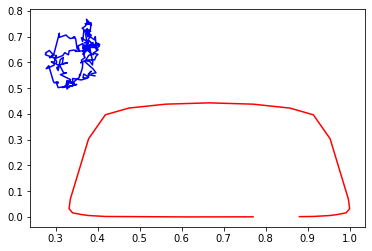

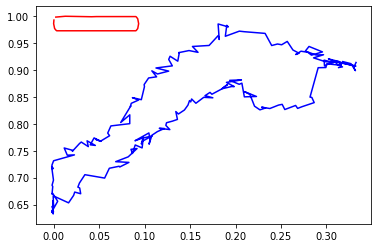

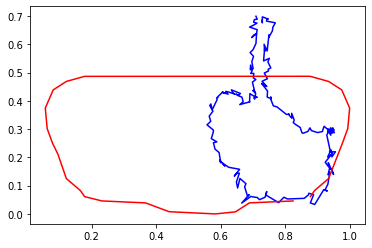

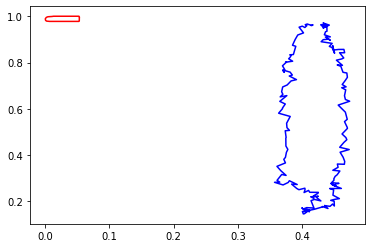

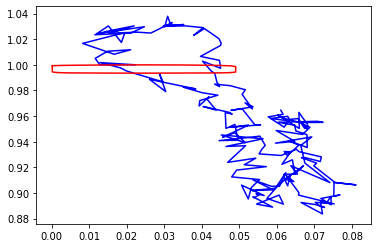

...

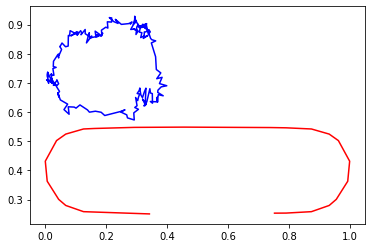

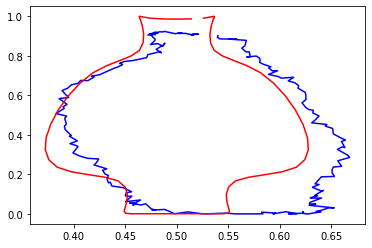

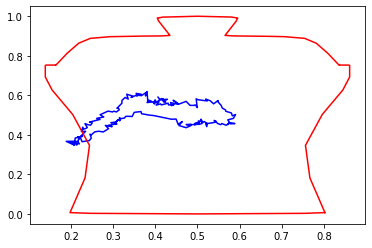

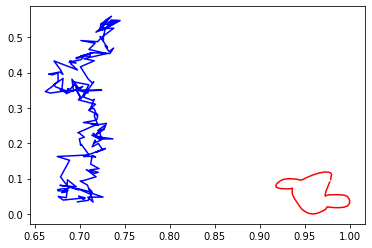

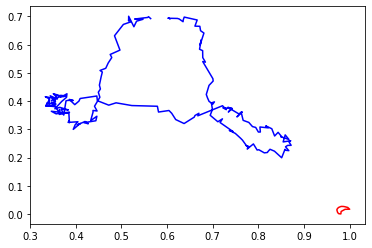

In [ ]:
#Plotting predictions on test
def plotComparison(y_pred, y_true):
  y_pred = y_pred.reshape((200,2))
  y_true = y_true.reshape((200,2))
  ax = plt.axes()
  ax.plot(y_pred[:, 0], y_pred[:, 1], c='b')
  ax.plot(y_true[:, 0], y_true[:, 1], c='r')
  plt.show()

y_hat = model.predict(X_test)

for pred, true in zip(y_hat, y_test):
  plotComparison(pred, true)

In [ ]:
# LOss on test
print(f'Test loss {model.computeLoss(X_test, y_test, addOnes=True)}')
# model.predict(X_test, addOnes)

(130, 2250)
Test loss 4245.928412049994


# Best model experiments

## Load best model and get results

In [ ]:
#Load best model 
bestModelFile = '/content/drive/MyDrive/MTH4320/bestModel/85.51470699414348.npy'

bestWeights = np.load(bestModelFile, allow_pickle=True)
# print(bestWeights[0].shape)
bestModel = FeedforwardNeuralNetwork([X_train.shape[1], 320, 160, y_train.shape[1]], alpha=0.0001,  activation='ELU', initialization=['Glorot', 'uniform'], lambda1=0.1, lambda2=0.001, gamma=0.1)
bestModel.W = bestWeights


## Best model loss on test

In [ ]:
#Best model test loss
print(f'Test loss {bestModel.computeLoss(X_test, y_test, addOnes=True)}')

(130, 2250)
Test loss 3842.007209717631


## Best model predictions on training set

(250, 2250)


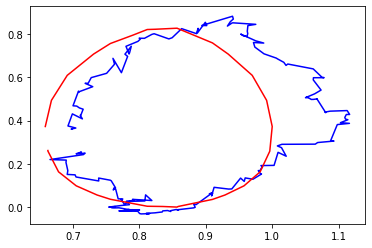

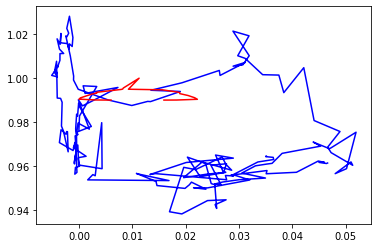

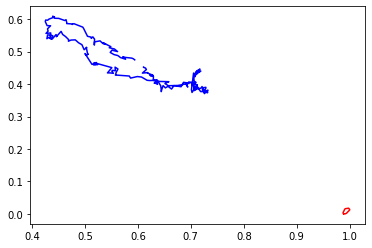

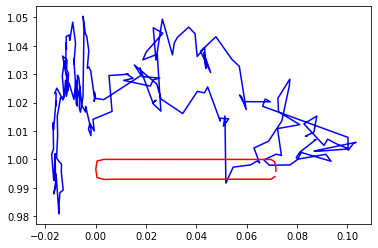

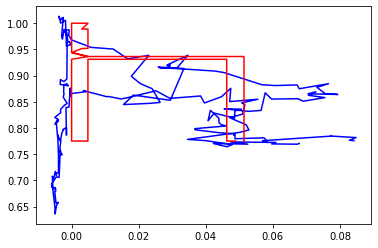

...

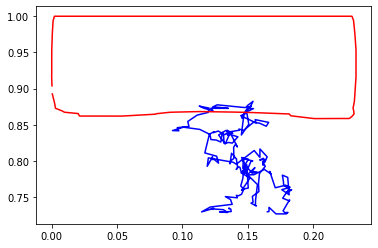

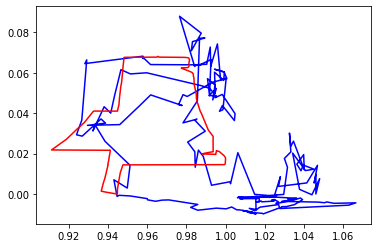

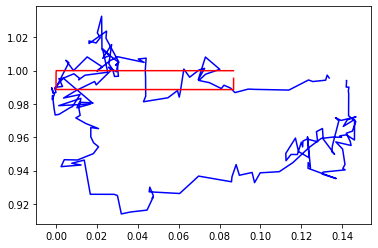

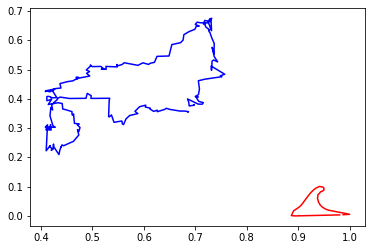

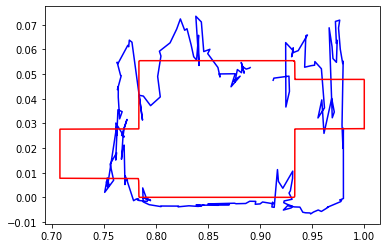

In [ ]:
y_hat = bestModel.predict(X_train)

for pred, true in zip(y_hat, y_train):
  plotComparison(pred, true)

## Best model predictions on test set

(130, 2250)


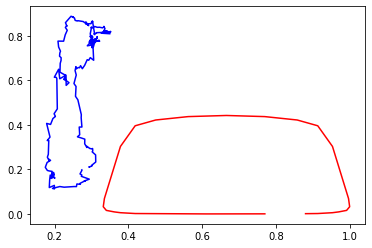

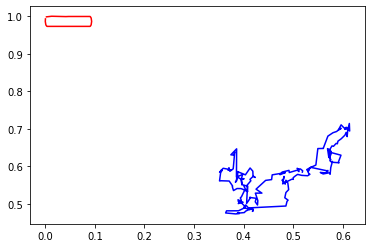

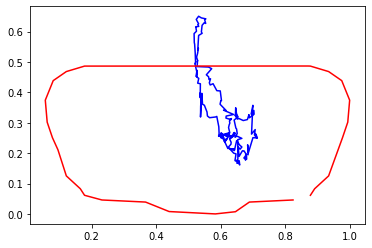

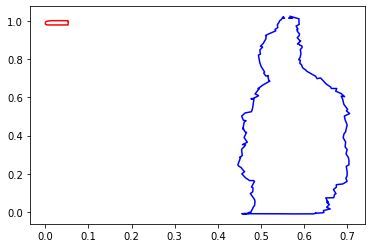

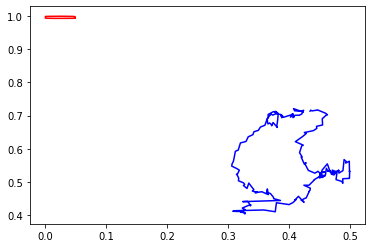

...

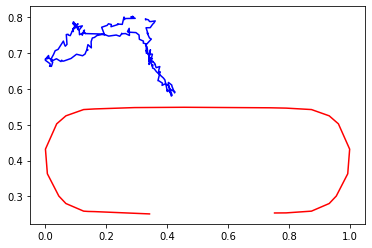

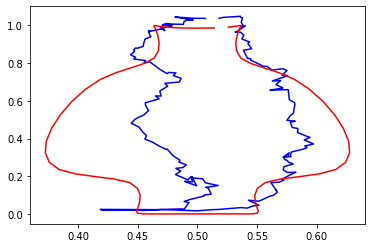

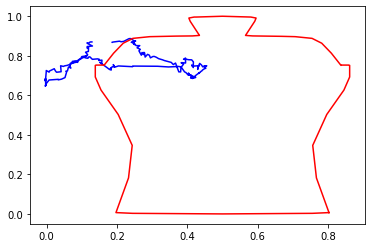

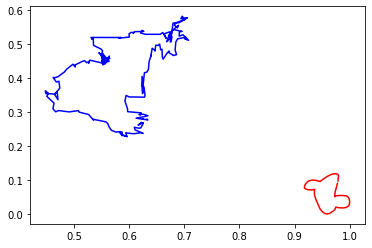

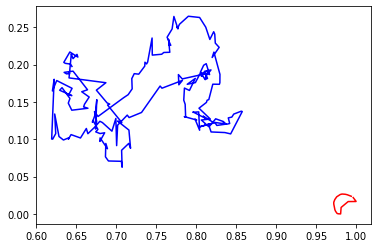

In [ ]:
y_hat = bestModel.predict(X_test)

for pred, true in zip(y_hat, y_test):
  plotComparison(pred, true)

# Neural Network

In [ ]:
class FeedforwardNeuralNetwork:
    
    # input a vector [a, b, c, ...] with the number of nodes in each layer
    def __init__(self, layers, alpha=0.1, activation='sigmoid', initialization='random', loss='sum-of-squares', lambda1=0, lambda2=0, gamma=0.0, inputWeights=0):
        
        # list of weight matrices between layers
        self.W = []
        
        # network architecture will be a vector of numbers of nodes for each layer
        self.layers = layers
        
        # learning rate
        self.alpha = alpha

        self.activation = activation

        self.lambda1 = lambda1
        self.lambda2 = lambda2

        #momentum
        self.gamma = gamma
        self.loss = loss

        self.validationAccuracies = []
        self.trainAccuracies = []

        self.losses = []
        
        # initialize the weights (randomly) -- this is our initial guess for gradient descent
        
        # initialize the weights between layers (up to the next-to-last one) as normal random variables
        if initialization == 'random':
            for i in np.arange(0, len(layers) - 2):
                self.W.append(np.random.randn(layers[i] + 1, layers[i + 1] + 1))
                
            # initialize weights between the last two layers (we don't want bias for the last one)
            self.W.append(np.random.randn(layers[-2] + 1, layers[-1]))

        # print(f'Init weights: {self.W}')
        if initialization == 'pretrained':
            self.W = inputWeights
            # for i in np.arange(0, len(layers) - 2):
            #     self.W.append(np.random.normal(0.0, 1.0, size=(
            #         layers[i] + 1, layers[i + 1] + 1))/initialization[1])

            # # initialize weights between the last two layers (we don't want bias for the last one)
            # self.W.append(np.random.normal(0.0, 1.0, size=(
            #     layers[-2] + 1, layers[-1]))/initialization[1])
     # initialize the weights between layers (up to the next-to-last one) as normal random variables
        if initialization[0] == 'normal':
            for i in np.arange(0, len(layers) - 2):
                self.W.append(np.random.normal(0.0, 1.0, size=(
                    layers[i] + 1, layers[i + 1] + 1))/initialization[1])

           # initialize weights between the last two layers (we don't want bias for the last one)
            self.W.append(np.random.normal(0.0, 1.0, size=(
                layers[-2] + 1, layers[-1]))/initialization[1])

        if initialization[0] == 'uniform':
            # initialize the weights between layers (up to the next-to-last one) as normal random variables
            for i in np.arange(0, len(layers) - 2):
                self.W.append(np.random.uniform(
                    initialization[1], initialization[2], size=(layers[i] + 1, layers[i + 1] + 1)))

            # initialize weights between the last two layers (we don't want bias for the last one)
            self.W.append(np.random.uniform(
                initialization[1], initialization[2], size=(layers[-2] + 1, layers[-1])))

        if initialization == 'Nielsen':
            # initialize the weights between layers (up to the next-to-last one) as normal random variables
            for i in np.arange(0, len(layers) - 2):
                self.W.append(np.random.normal(0.0, 1.0, size=(
                    layers[i] + 1, layers[i + 1] + 1))/layers[i+1])

            # initialize weights between the last two layers (we don't want bias for the last one)
            self.W.append(np.random.normal(0.0, 1.0, size=(
                layers[-2] + 1, layers[-1]))/layers[-1])

        # LeCun, Glorot, and He initialization
        if initialization[0] in ['LeCun', 'Glorot', 'He']:
            # initialize the weights between layers (up to the next-to-last one) as normal random variables
            for i in np.arange(0, len(layers) - 2):

                # define the limit term for normal random variables

                # LeCun initialization ("efficient backprop", default initialization in PyTorch)
                if initialization[0] == 'LeCun':
                    limit = np.sqrt(1.0 / layers[i+1])

                # Glorot initialization (default initialization in Keras)
                elif initialization[0] == 'Glorot':
                    mean = (layers[i] + layers[i+1])/2.0
                    limit = np.sqrt(1.0 / mean)

                # He initialization (typically used for very deep nets with PReLU activation)
                elif initialization[0] == 'He':
                    limit = np.sqrt(2.0 / layers[i+1])

                # generate the weights
                if initialization[1] == 'normal':
                    self.W.append(np.random.normal(
                        0.0, limit, size=(layers[i] + 1, layers[i + 1] + 1)))

                elif initialization[1] == 'uniform':
                    limit *= np.sqrt(3.0)
                    self.W.append(np.random.uniform(-limit, limit,
                                                    size=(layers[i] + 1, layers[i + 1] + 1)))

            # initialize weights between the last two layers (we don't want bias for the last one)

            # define the limit term for normal random variables
            if initialization[0] == 'LeCun':
                limit = np.sqrt(1.0 / layers[-2])

            elif initialization[0] == 'Glorot':
                mean = (layers[-2] + layers[-1])/2.0
                limit = np.sqrt(1.0 / mean)

            elif initialization[0] == 'He':
                limit = np.sqrt(2.0 / layers[-2])

            # initialize the weights
            if initialization[1] == 'normal':
                self.W.append(np.random.normal(
                    0.0, limit, size=(layers[-2] + 1, layers[-1])))

            elif initialization[1] == 'uniform':
                limit *= np.sqrt(3.0)
                self.W.append(np.random.uniform(-limit, limit,
                                                size=(layers[-2] + 1, layers[-1])))
    def activate(self, x):
        if self.activation == 'sigmoid':
            return 1.0 / (1 + np.exp(-x))
        elif self.activation == 'ReLu':
            return x*(x >= 0)
        elif self.activation == 'ELU':
            return x*(x >= 0) + 0.1*(np.exp(x) - 1)*(x < 0)


    def activationDerivative(self, x):
        if self.activation == 'sigmoid':
            return x * (1 - x)
        elif self.activation == 'ReLu':
            return (x >= 0).astype(np.int)
        elif self.activation == 'ELU':
            return 1*(x >= 0) + 0.1*np.exp(x)*(x < 0)
    # define the sigmoid activation
    # def sigmoid(self, x):
    #     return 1.0 / (1 + np.exp(-x))
    
    # # define the sigmoid derivative (where z is the output of a sigmoid)
    # def sigmoidDerivative(self, z):
    #     return z * (1 - z)
    
    # fit the model
    def fit(self, X, y, epochs=10000, update=1000, valX=np.array([0]), valY=np.array([0]), validation=False):
        # add a column of ones to the end of X
        print('Training started')
        X = np.hstack((X, np.ones([X.shape[0],1])))
        # use one-hot encoding for the training labels
        # y = LabelBinarizer().fit_transform(y)

        self.epochs = epochs
        self.update = update
        self.losses = []
        v = []
        
        for layer in np.arange(0, len(self.W)):
            v.append(np.zeros(self.W[layer].shape))
        
        loss = 1000
        for epoch in np.arange(0,epochs):

            # print(epoch)
            if loss > 13:
              # feed forward, backprop, and weight update
              for (x, target) in zip(X, y):
                  
                  # make a list of output activations from the first layer
                  # (just the original x values)
                  A = [np.atleast_2d(x)]
                  
                  # feed forward
                  for layer in np.arange(0, len(self.W)):
                      
                      # feed through one layer and apply sigmoid activation
                      net = A[layer].dot(self.W[layer])
                      # print(self.sigmoid(net)[0])
                      # out = self.sigmoid(net)
                      out = self.activate(net)
                      
                      # if epoch % update == 0 and layer == 0:
                      #     print(f'epoch: {epoch}')
                      #     print(f'layer: {layer}, weight norm: {np.linalg.norm(out)}')

                      # if epoch == 0:
                      #     print('Activations')
                      #     print(out)
                      
                      # add our network output to the list of activations
                      A.append(out)
                      
                  # backpropagation
                  error = A[-1] - target
                  
                  # term proportional to the gradient
                  # D = [error * self.sigmoidDerivative(A[-1])]
                  D = [error * self.activationDerivative(A[-1])]
                  
                  # loop backwards over the layers to build up deltas
                  for layer in np.arange(len(A) - 2, 0, -1):
                      delta = D[-1].dot(self.W[layer].T)
                      # delta = delta * self.sigmoidDerivative(A[layer])
                      # print(self.activationDerivative(A[layer]))
                      # if epoch == 10:
                      #     print('Activation derivative')
                      #     print(self.activationDerivative(A[layer]))
                      delta = delta * self.activationDerivative(A[layer])
                      D.append(delta)
                      
                  # reverse the deltas since we looped in reverse
                  D = D[::-1]
                  
                  # weight update
                  # for layer in np.arange(0, len(self.W)):
                  #     self.W[layer] -= self.alpha * A[layer].T.dot(D[layer])
                  # weight update
                  for layer in np.arange(0, len(self.W)):
                      gradient = (A[layer].T.dot(D[layer])
                                  + (self.lambda1 / X.shape[0]) *
                                  np.sign(self.W[layer])
                                  + (self.lambda2 / X.shape[0]) * self.W[layer])

                      v[layer] = self.gamma * v[layer] + self.alpha * gradient
                      self.W[layer] -= v[layer]
                      
              # print a status update
              if (epoch + 1) % update == 0:
                  loss = self.computeLoss(X,y)
                  self.losses.append(loss)
                  # if validation:
                  #   predictedY = self.predict(valX)
                  #   predictedY = predictedY.argmax(axis=1)
                  #   validationAccuracy = accuracy_score(valY, predictedY)

                  # predictedY = self.predict(trainX)
                  # predictedY = predictedY.argmax(axis=1)
                  # trainAccuracy = accuracy_score(trainY, predictedY)

                  # if validation:
                  #   self.validationAccuracies.append(validationAccuracy)
                  # self.trainAccuracies.append(trainAccuracy)

                  print('Epoch =', epoch + 1, 'loss = ', loss)
                  print(f'Layer 0 weight norm: {np.linalg.norm(self.W[0])}')
                  self.saveWeights(loss) #Will only save weights if current loss is better
                  # if (epoch + 1) % update*10 == 0:
                  #     self.saveWeights(epoch, loss)
                  print('---------------------------------')

              if (epoch + 1) % update*10-1 == 0:
                  print(f'Saving weights...')
                  loss = self.computeLoss(X,y)
                  self.saveWeights(epoch, loss)
            else:
              print(f'Converged to loss: {loss}')
              break

                
    def predict(self, X, addOnes = True):
        # initialize data, be sure it's the right dimension
        # print(X)
        p = np.atleast_2d(X)
        
        # add a column of 1s for bias
        if addOnes:
            print(X.shape)
            p = np.hstack((p, np.ones([X.shape[0],1])))
        
        # feed forward!
        for layer in np.arange(0, len(self.W)):
            # p = self.sigmoid(np.dot(p, self.W[layer]))
            p = self.activate(np.dot(p, self.W[layer]))
         
        # return the predictions
        return p
    
    def computeLoss(self, X, y, addOnes = False):
        # initialize data, be sure it's the right dimension
        y = np.atleast_2d(y)
        
        # feed the datapoints through the network to get predicted outputs
        predictions = self.predict(X, addOnes = addOnes)
        # predictions = self.predict(X)

        # predictions = np.argmax(predictions)
        
        # compute the sum of squared errors loss function
        # print(f'predictions shape: {predictions.shape}')
        # print(f'y shape: {y.shape}')
        if self.loss == 'sum-of-squares':
            loss = np.sum((predictions - y)**2) / 2.0

        if self.loss == 'cross-entropy':
            loss = np.sum(np.nan_to_num(-y*np.log(predictions) -
                                        (1-y)*np.log(1-predictions)))

        if self.lambda1 != 0:
            # compute the L1 penalty
            L1penalty = 0

            for layer in np.arange(0, len(self.W)):
                L1penalty += np.sum(np.abs(self.W[layer]))

            # add the L1 penalty to the loss
            loss = loss + (self.lambda1 / X.shape[0]) * L1penalty

        # if there is an L2 penalty, compute it and add it to the loss
        if self.lambda2 != 0:
            # compute the L2 penalty
            L2penalty = 0

            for layer in np.arange(0, len(self.W)):
                L2penalty += np.sum(self.W[layer] ** 2)

            # add the L2 penalty to the loss
            loss = loss + (self.lambda2 / X.shape[0]) * L2penalty
        
        return loss

    def saveWeights(self, l):
        modelsPath = '/content/drive/MyDrive/MTH4320/models'
        print('Listing files in path...')
        saved_models = os.listdir(modelsPath)
        for saved_model in saved_models:
          if saved_model.split('.')[-1] == 'npy':
            print(f'Saved model: {saved_model}')
            if int(saved_model.split('.')[0]) > int(l): #Only save if current weights are better
              new_model = f'{modelsPath}/{int(l)}.npy'
              os.remove(os.path.join(modelsPath , saved_model))
              np.save(new_model, self.W)
              print('Better model saved!')
                # with open(f'{modelsPath}/{int(l)}.npy', 'wb') as f:
                #     np.save(f, self.W)
            else:
              print('New weights are not better')
              

    def plotPerformance(self):
        fig, ax1 = plt.subplots()

        # plot the losses
        ax1.plot(np.arange(0, self.epochs, self.update), self.losses, label='Loss')
        ax1.set_xlabel('Training Epoch')
        ax1.set_ylabel('Loss')

        # # make another y axis using the same x axis
        # ax2 = ax1.twinx()

        # # plot the accuracy
        # p2 = ax2.plot(np.arange(0, self.epochs, self.update), self.trainAccuracies,
        #               label='Accuracy (train)', color='tab:orange')
        # p3 = ax2.plot(np.arange(0, self.epochs, self.update), self.validationAccuracies,
        #               label='Accuracy (validation)', color='tab:green')
        # ax2.set_ylabel('Accuracy')

        # # add a legend
        # ps = p1 + p2 + p3
        # labs = [p.get_label() for p in ps]
        # ax1.legend(ps, labs, loc=0)

# Data processing and edge pooling functions

In [ ]:
def edgePooling(meshEdges, resolution):
  n = meshEdges.shape[0]
  # print(f'n = {n}')
  batchSize = int(n/resolution)
  maxEdges = np.zeros((resolution, 5))
  # print(f'batchSize = {batchSize}')
  j = 0
  for i in range(resolution):
    batch = meshEdges[j:j+batchSize]
    norms = np.sqrt(np.einsum("ij,ij->i", batch, batch))
    maxEdges[i] = normalize(batch[np.argmax(norms)])
    j += batchSize


  # for j, i in enumerate(range(0, n, batchSize)):
  #   batch = meshEdges[i:i+batchSize]
  #   norms = np.sqrt(np.einsum("ij,ij->i", batch, batch))
  #   maxEdges[j] = normalize(batch[np.argmax(norms)])

  return maxEdges

def normalize(x):
  # return x / np.linalg.norm(x) #Use PRelu when using this
  return (x - np.min(x))/(np.max(x) - np.min(x)) #between 0-1
# raw_input_data[0].shape
def plotSlice(s):
   ax = plt.axes()
   ax.plot(s[:, 0], s[:, 1])
   plt.show()

def dataProcessing(X_raw, y_raw, edgeResolution=450):
  edgeResolution = 450
  i = 0
  X_train = np.zeros((len(X_raw), edgeResolution*X_raw[0].shape[1]))
  y_train = np.zeros((len(y_raw), y_raw[0].shape[0]*y_raw[0].shape[1]))
  for meshEdges, meshSlice in zip(X_raw, y_raw):
    # print(meshSlice.shape)
    pooledEdges = edgePooling(meshEdges, edgeResolution) #Get features with highest manitude from consecutive batches
    X_train[i] = pooledEdges.flatten()
    meshSlice = normalize(meshSlice)
    # plotSlice(meshSlice)
    y_train[i] = meshSlice.flatten()
    i+=1
    # X_train.append(pooledEdges.flatten())
    
    # y_train.append(meshSlice.flatten())
  # Normalize input and output
  return X_train, y_train
  # len(X_train)


In [ ]:
while True:pass

KeyboardInterrupt: ignored